In [77]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns


from sklearn.metrics import f1_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve,auc

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from collections import Counter

from catboost import CatBoostClassifier
from xgboost import XGBClassifier

import keras
from keras import models
from keras import layers
import tensorflow as tf
from keras.backend import binary_crossentropy
from keras import backend as K
from keras.callbacks import Callback
from keras import optimizers
from keras.backend import mean
from keras import regularizers
from keras.layers import Dropout
from keras.layers import BatchNormalization
from keras.models import load_model

import warnings
warnings.filterwarnings('ignore')

In [78]:
config = tf.ConfigProto()
config.gpu_options.allow_growth = True
session = tf.Session(config=config)
K.clear_session()

# Reading Data

In [79]:
path = '/home/ricardo/TCC/'

In [80]:
df = pd.read_csv(path+'train.csv', sep = ',')
X = df.loc[:,'var_0':'var_199']
Y = df.loc[:,'target']

In [81]:
df.head()

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
0,train_0,0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,...,4.4354,3.9642,3.1364,1.6910,18.5227,-2.3978,7.8784,8.5635,12.7803,-1.0914
1,train_1,0,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,...,7.6421,7.7214,2.5837,10.9516,15.4305,2.0339,8.1267,8.7889,18.3560,1.9518
2,train_2,0,8.6093,-2.7457,12.0805,7.8928,10.5825,-9.0837,6.9427,14.6155,...,2.9057,9.7905,1.6704,1.6858,21.6042,3.1417,-6.5213,8.2675,14.7222,0.3965
3,train_3,0,11.0604,-2.1518,8.9522,7.1957,12.5846,-1.8361,5.8428,14.9250,...,4.4666,4.7433,0.7178,1.4214,23.0347,-1.2706,-2.9275,10.2922,17.9697,-8.9996
4,train_4,0,9.8369,-1.4834,12.8746,6.6375,12.2772,2.4486,5.9405,19.2514,...,-1.4905,9.5214,-0.1508,9.1942,13.2876,-1.5121,3.9267,9.5031,17.9974,-8.8104


# Normalazing Data

In [82]:
meanX = X.mean(axis = 0)
stdX = X.std(axis = 0)
X_norm = (X-meanX)/stdX

# Separating the Data in anomaly and not anomaly

In [83]:
fraud_index = np.where(Y==1)
honest_index = np.where(Y==0)
fraud = X_norm.loc[fraud_index]
honest = X_norm.loc[honest_index]

yh = Y.loc[honest_index]
yf = Y.loc[fraud_index]

# Balanced Data

### Verifying how unbalanced is our dataset

Text(0.5, 1.0, '8.951238929246692')

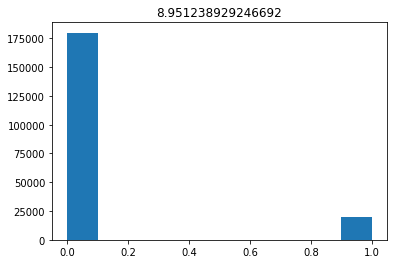

In [84]:
plt.hist(Y)
plt.title(len(yh)/len(yf))

### To balance the data we will eliminate some not anomaly samples

In [85]:
h_used, x_trash, yh, y_trash = train_test_split(honest, yh, test_size = 0.75, random_state = 30)
x_used = pd.concat([h_used,fraud],ignore_index = False)
y_used = pd.concat([yh,yf],ignore_index=False)

### Verifying if it is balanced now

Text(0.5, 1.0, '2.2377848542143495')

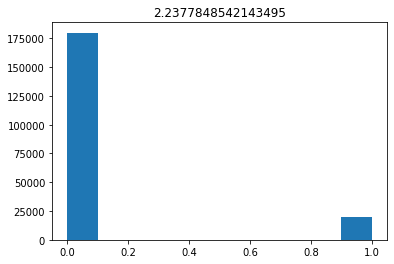

In [86]:
plt.hist(Y)
plt.title(len(yh)/len(yf))

# Separating in Train, Val and Test data

In [87]:
x_train,x_test,y_train,y_test = train_test_split(x_used,y_used,test_size=0.3,random_state = 30)
x_val,x_test,y_val,y_test = train_test_split(x_test,y_test,test_size=0.5,random_state = 30)

In [88]:
x_data = [x_train,x_val,x_test]
y_data = [y_train,y_val,y_test]

### Verifying the size of each dataframe

In [89]:
print('Size of Train Data: {0}, not anomalys/anomaly:{1}'.format(len(x_data[0]),Counter(y_data[0])))
print('Size of val Data: {0}, not anomalys/anomaly:{1}'.format(len(x_data[1]),Counter(y_data[1])))
print('Size of test Data: {0}, not anomalys/anomaly:{1}'.format(len(x_data[2]),Counter(y_data[2])))

Size of Train Data: 45551, not anomalys/anomaly:Counter({0: 31412, 1: 14139})
Size of val Data: 9761, not anomalys/anomaly:Counter({0: 6779, 1: 2982})
Size of test Data: 9761, not anomalys/anomaly:Counter({0: 6784, 1: 2977})


# Importing some metrics to evaluating the models.

In [90]:
def f1Score(y_true, y_pred):
    def recall(y_true, y_pred):
        """Recall metric.

        Only computes a batch-wise average of recall.

        Computes the recall, a metric for multi-label classification of
        how many relevant items are selected.
        """
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
        recall = true_positives / (possible_positives + K.epsilon())
        return recall

    def precision(y_true, y_pred):
        """Precision metric.

        Only computes a batch-wise average of precision.

        Computes the precision, a metric for multi-label classification of
        how many selected items are relevant.
        """
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
        precision = true_positives / (predicted_positives + K.epsilon())
        return precision
    precision = precision(y_true, y_pred)
    recall = recall(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))

In [91]:
from sklearn.utils.multiclass import unique_labels
from sklearn.metrics import confusion_matrix
def plot_confusion_matrix(y_true, y_pred, classes,
                          normalize=False,
                          title=None,
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if not title:
        if normalize:
            title = 'Normalized confusion matrix'
        else:
            title = 'Confusion matrix, without normalization'

    # Compute confusion matrix
    cm = confusion_matrix(y_true, y_pred)
    # Only use the labels that appear in the data
    classes = classes[unique_labels(y_true, y_pred)]
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    fig, ax = plt.subplots()
    im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
    ax.figure.colorbar(im, ax=ax)
    # We want to show all ticks...
    ax.set(xticks=np.arange(cm.shape[1]),
           yticks=np.arange(cm.shape[0]),
           # ... and label them with the respective list entries
           xticklabels=classes, yticklabels=classes,
           title=title,
           ylabel='True label',
           xlabel='Predicted label')

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
             rotation_mode="anchor")

    # Loop over data dimensions and create text annotations.
    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):
            ax.text(j, i, format(cm[i, j], fmt),
                    ha="center", va="center",
                    color="white" if cm[i, j] > thresh else "black")
    fig.tight_layout()
    return ax

# Here we have 3 differents model, each of them will make a especific work:

- The best non anomaly predictor.
- The best anomaly predictor.
- Balanced predictor.

In [92]:
xgb = XGBClassifier()
xgb.load_model(path+'Undersampling/Boost/models/XGBoostClassifier')

RNA5 = load_model(path+'Undersampling/models/RNA5/RNA5.h5', custom_objects={'f1Score': f1Score})

catBoost = CatBoostClassifier()
catBoost.load_model(path+'/Undersampling/Boost/models/CatBoostClassifier')

In [93]:
RNA5.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 100)               20100     
_________________________________________________________________
dropout_1 (Dropout)          (None, 100)               0         
_________________________________________________________________
dense_2 (Dense)              (None, 100)               10100     
_________________________________________________________________
dropout_2 (Dropout)          (None, 100)               0         
_________________________________________________________________
dense_3 (Dense)              (None, 100)               10100     
_________________________________________________________________
dropout_3 (Dropout)          (None, 100)               0         
_________________________________________________________________
dense_4 (Dense)              (None, 1)                 101       
Total para

## To make an algorithm do some especific job, you need to change the threshold and analyse the results.

In [94]:
def choosing_threshold(y_true,y_prob,threshold_list):
    y_hat = []
    precision = []
    recall = []
    f1 = []
    y_h = []
    for threshold in threshold_list:
        for i in range(len(y_true)):
            if y_prob[i]>threshold:
                y_hat.append(1)
            else:
                y_hat.append(0)
        precision.append(precision_score(y_true,y_hat))
        recall.append(recall_score(y_true,y_hat))
        f1.append(f1_score(y_true,y_hat))
        y_h.append(y_hat)
        y_hat = []
    return(precision,recall,f1,y_h)                       

## XGBoostClassifier

In [95]:
threshold_list = np.arange(0,1,0.01)
prob = np.ravel(xgb.predict_proba(x_data[0])[:,1])
precision,recall,f1,yprob = choosing_threshold(y_data[0],prob,threshold_list)

print('precision values: {}'.format(precision))
print('recall values: {}'.format(recall))
print('f1 values: {}'.format(f1))

precision values: [0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.31039933261618846, 0.3104061470911087, 0.3104265923112389, 0.31044704022483754, 0.3104879441345689, 0.31055614127569847, 0.31064484235966167, 0.31078140454995057, 0.31103436138853446, 0.3113151463108528

Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized co

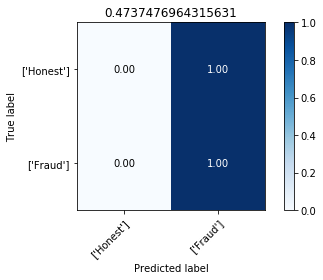

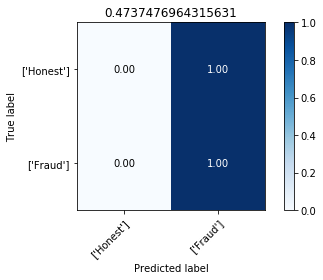

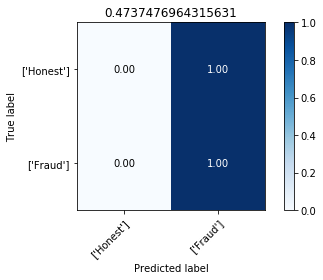

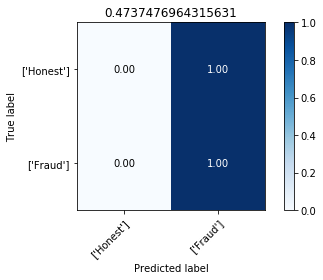

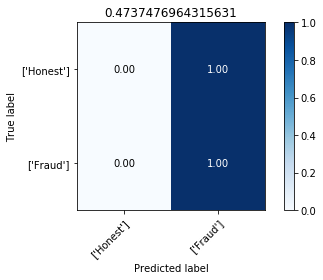

...

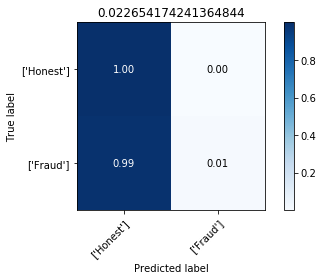

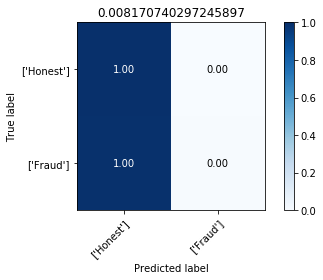

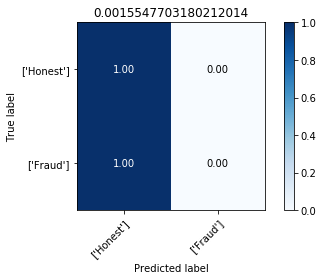

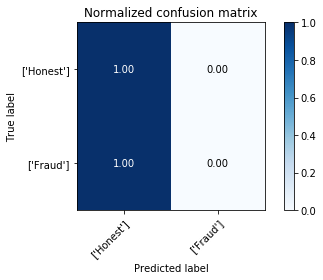

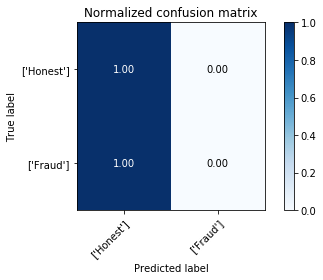

In [96]:
for i in range(len(yprob)):
    plot_confusion_matrix(y_data[0], yprob[i],
                          classes = np.array([['Honest'],['Fraud']]),
                          normalize=True,
                          title= f1[i],
                          cmap=plt.cm.Blues)

In [97]:
threshold_list[f1.index(0.6063446776713539)]

0.6900000000000001

In [98]:
threshold = []
threshold.append(threshold_list[f1.index(0.6063446776713539)])

# CatBoostClassifier

In [99]:
threshold_list = np.arange(0,1,0.01)
prob = np.ravel(catBoost.predict_proba(x_data[0])[:,1])
precision,recall,f1,yprob = choosing_threshold(y_data[0],prob,threshold_list)

print('precision values: {}'.format(precision))
print('recall values: {}'.format(recall))
print('f1 values: {}'.format(f1))

precision values: [0.31039933261618846, 0.31166512366089144, 0.319371964305885, 0.33137981152421586, 0.34494467107995214, 0.3604802656788862, 0.3762415892342198, 0.39369946562963376, 0.4106208146913472, 0.4280216255841657, 0.44468491406747296, 0.46122002914293286, 0.47741025993673497, 0.4946005864263749, 0.5100099914887318, 0.5260029147810079, 0.5411829959193376, 0.5565925743992796, 0.5717364662130753, 0.586991586381272, 0.6024621467403514, 0.6173639392817475, 0.6318673464525659, 0.6458170062695925, 0.659624886558435, 0.6733119304059652, 0.6867732172250837, 0.698792559556184, 0.7109514260249554, 0.723185759926974, 0.7355260851784775, 0.7486666267154072, 0.7602428851815506, 0.7697801165194512, 0.7806736680327869, 0.7892121608368748, 0.7990919409761634, 0.8103236378533388, 0.818733012753502, 0.8287139294620591, 0.8379912663755459, 0.8462336892052195, 0.8529700354743754, 0.8597396595548025, 0.8689362371255602, 0.8766870179948586, 0.8842778643483966, 0.8905176746523705, 0.8966549747625974,

Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0.00588947 0.99411053]
 [0.         1.        ]]
Normalized confusion matrix
[[4.08760983e-02 9.59123902e-01]
 [1.41452719e-04 9.99858547e-01]]
Normalized confusion matrix
[[9.20030562e-02 9.07996944e-01]
 [2.12179079e-04 9.99787821e-01]]
Normalized confusion matrix
[[0.14631351 0.85368649]
 [0.00127307 0.99872693]]
Normalized confusion matrix
[[0.20304342 0.79695658]
 [0.00198034 0.99801966]]
Normalized confusion matrix
[[0.25630332 0.74369668]
 [0.00339487 0.99660513]]
Normalized confusion matrix
[[0.31010442 0.68989558]
 [0.00473867 0.99526133]]
Normalized confusion matrix
[[0.35836623 0.64163377]
 [0.00686046 0.99313954]]
Normalized confusion matrix
[[0.4038584  0.5961416 ]
 [0.00891152 0.99108848]]
Normalized confusion matrix
[[0.44454349 0.55545651]
 [0.0118113  0.9881887 ]]
Normalized confusion matrix
[[0.48207691 0.51792309]
 [0.01499399 0.98500601]]
Normalized confusion matrix
[[0.51614033 0.48385967]

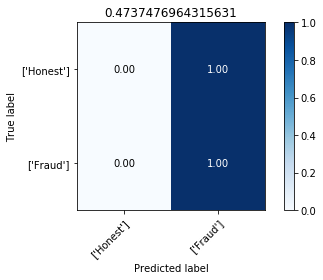

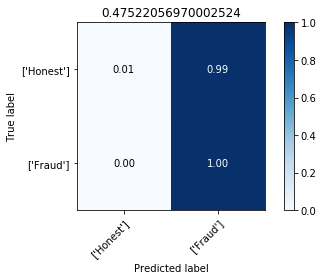

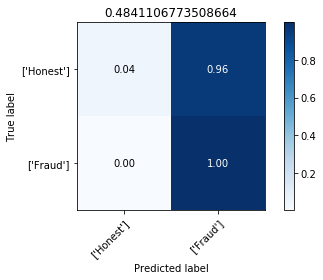

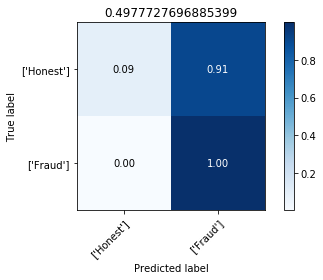

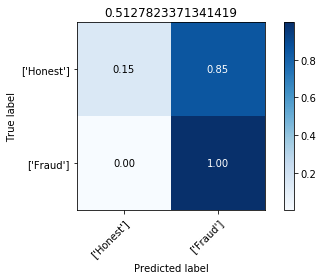

...

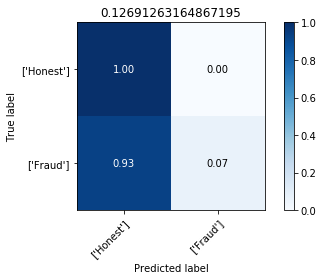

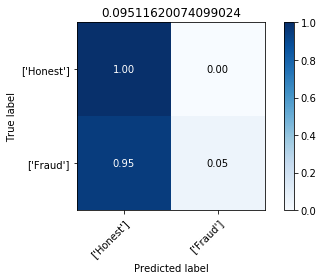

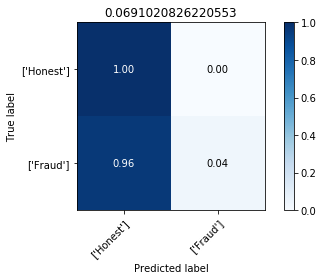

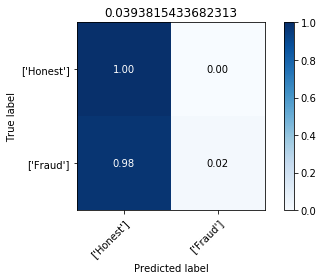

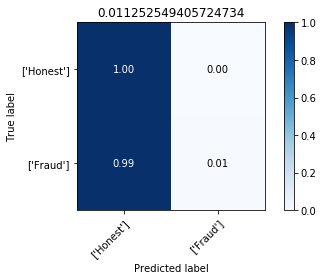

In [100]:
for i in range(len(yprob)):
    plot_confusion_matrix(y_data[0], yprob[i],
                          classes = np.array([['Honest'],['Fraud']]),
                          normalize=True,
                          title= f1[i],
                          cmap=plt.cm.Blues)

In [101]:
threshold_list[f1.index(max(f1))]

0.41000000000000003

In [102]:
threshold.append(threshold_list[f1.index(max(f1))])

## RNA5


In [103]:
threshold_list = np.arange(0,1,0.01)
prob = np.ravel(RNA5.predict(x_data[0]))
precision,recall,f1,yprob = choosing_threshold(y_data[0],prob,threshold_list)

In [104]:
print('precision values: {}'.format(precision))
print('recall values: {}'.format(recall))
print('f1 values: {}'.format(f1))

precision values: [0.31039933261618846, 0.31246961057331035, 0.3292657318182879, 0.34831516352824576, 0.36748856526996476, 0.38467290754999167, 0.4013131137063506, 0.41519900572918245, 0.42755972427685623, 0.43926179977135393, 0.45155615696887685, 0.4614124372559955, 0.4726965524679153, 0.4829513901743734, 0.49277291745910995, 0.5026188242651657, 0.5118722926359698, 0.5205029172487469, 0.5282415779955419, 0.5371408851695281, 0.543925315954027, 0.5508543165467625, 0.5592247278739724, 0.567138224373737, 0.5754866618601298, 0.5839642119752236, 0.5903094748457641, 0.597379331524799, 0.603702737940026, 0.6108505649115327, 0.6173000598053607, 0.6243406806951307, 0.6311247374098677, 0.6378153205276557, 0.6434592937570005, 0.6494325346784363, 0.6545043393228211, 0.6598541965231478, 0.6663701067615658, 0.6723691031622603, 0.6790980625537261, 0.6841536695699143, 0.6884930187770824, 0.694125070106562, 0.7010869565217391, 0.7079523008266881, 0.7133467772051684, 0.7184621240959269, 0.72398506766215

Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[9.67783013e-03 9.90322170e-01]
 [7.07263597e-05 9.99929274e-01]]
Normalized confusion matrix
[[0.08484019 0.91515981]
 [0.00190961 0.99809039]]
Normalized confusion matrix
[[0.16267668 0.83732332]
 [0.00572884 0.99427116]]
Normalized confusion matrix
[[0.23398701 0.76601299]
 [0.01124549 0.98875451]]
Normalized confusion matrix
[[0.29272253 0.70727747]
 [0.01768159 0.98231841]]
Normalized confusion matrix
[[0.34394499 0.65605501]
 [0.02298607 0.97701393]]
Normalized confusion matrix
[[0.38583981 0.61416019]
 [0.03126105 0.96873895]]
Normalized confusion matrix
[[0.42101745 0.57898255]
 [0.03925313 0.96074687]]
Normalized confusion matrix
[[0.45348911 0.54651089]
 [0.04887191 0.95112809]]
Normalized confusion matrix
[[0.48389151 0.51610849]
 [0.05594455 0.94405545]]
Normalized confusion matrix
[[0.50811792 0.49188208]
 [0.06379518 0.93620482]]
Normalized confusion matrix
[[0.5330447 0.4669553]
 [0.0700191 0.929

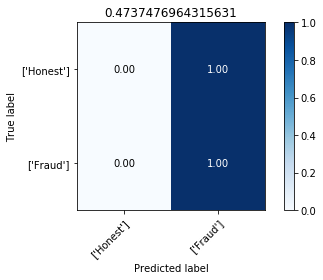

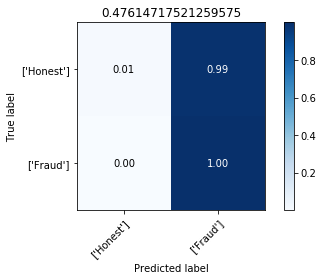

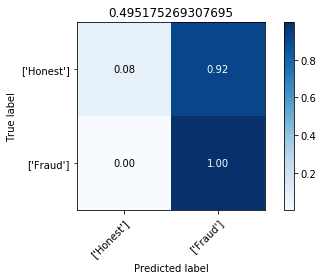

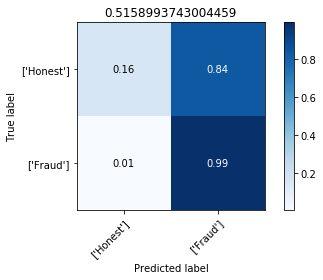

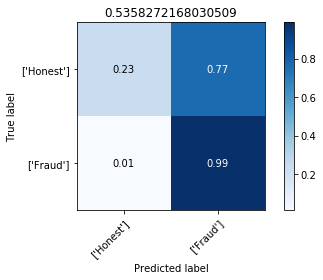

...

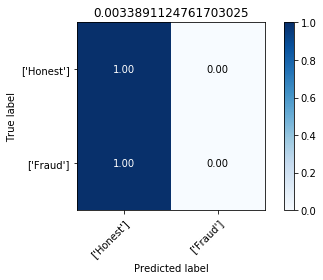

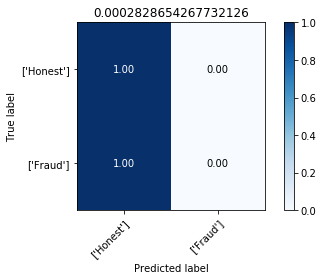

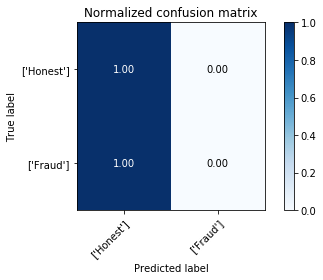

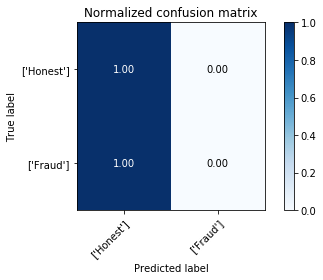

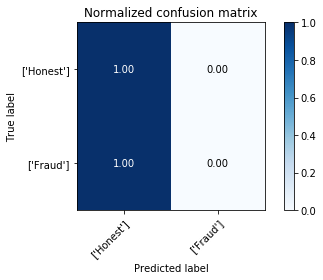

In [105]:
for i in range(len(yprob)):
    plot_confusion_matrix(y_data[0], yprob[i],
                          classes = np.array([['Honest'],['Fraud']]),
                          normalize=True,
                          title= f1[i],
                          cmap=plt.cm.Blues)

In [106]:
threshold_list[f1.index(0.6445573233701356)]

0.6

In [107]:
threshold.append(threshold_list[f1.index(0.6445573233701356)])

# After make the analysis and choose one specific threshold for each one, we will define a new DataFrame

- ## So Lets make the preditions with the thresholds

In [108]:
y_hat_cat = []
y_hat_xgb = []
y_hat_rna = []

y_prob_cat = []
y_prob_xgb = []
y_prob_rna = []

In [109]:
def predict_threshold(y_prob,threshold):
    y_hat = []
    for i in range(len(y_prob)):
        if y_prob[i]>threshold:
            y_hat.append(1)
        else:
            y_hat.append(0)
    return y_hat

In [110]:
for i in range(len(x_data)):
    y_prob_xgb.append(np.ravel(xgb.predict_proba(x_data[i])[:,1]))
    y_hat_xgb.append(predict_threshold(y_prob_xgb[i],threshold[0])) 

    y_prob_cat.append(np.ravel(catBoost.predict_proba(x_data[i])[:,1]))
    y_hat_cat.append(predict_threshold(y_prob_cat[i],threshold[1]))

    y_prob_rna.append(np.ravel(RNA5.predict(x_data[i])))
    y_hat_rna.append(predict_threshold(y_prob_rna[i],threshold[2]))

- ## Build a new DataFrame with the answers

In [111]:
new_data = [np.vstack((y_hat_xgb[0],y_prob_xgb[0],y_hat_cat[0],y_prob_cat[0],y_hat_rna[0],y_prob_rna[0],y_train)).T,
         np.vstack((y_hat_xgb[1],y_prob_xgb[1],y_hat_cat[1],y_prob_cat[1],y_hat_rna[1],y_prob_rna[1],y_val)).T,
         np.vstack((y_hat_xgb[2],y_prob_xgb[2],y_hat_cat[2],y_prob_cat[2],y_hat_rna[2],y_prob_rna[2],y_test)).T] 

- ## Add some new features, like the mean and the geometric mean of the probabilities

In [112]:
aux_data = []
for i in range(len(new_data)):
    aux =  pd.DataFrame(data = new_data[i], columns = ['hat_xgb','prob1_xgb','hat_cat','prob1_cat',
                                                         'hat_rna','prob1_rna','target'])
    average = pd.DataFrame(aux.iloc[:,[1,3,5]].mean(axis = 1, skipna = True),columns=['mean'])
    aux = aux.join(average.reset_index(drop=True))
    geo_mean = pd.DataFrame(np.sqrt(aux.iloc[:,[1,3,5]].prod(axis = 1, skipna = True))/
                           aux.iloc[:,[1,3,5]].sum(axis = 1, skipna = True),columns=['geo_mean'])
    aux = aux.join(geo_mean.reset_index(drop=True))
    aux['prob0_xgb'] = aux.iloc[:,1]
    aux['prob0_cat'] = 1 - aux.iloc[:,3]
    aux['prob0_rna'] = 1 - aux.iloc[:,5]                  
    aux['id'] = aux.index
    aux.set_index('id',inplace = True)
    aux = aux[['hat_xgb','prob1_xgb','prob0_xgb','hat_cat','prob1_cat','prob0_cat',
               'hat_rna','prob1_rna','prob0_rna','geo_mean','mean','target']]
    aux_data.append(aux)
new_data = aux_data
aux_data = None

In [113]:
new_data[0].head()

,hat_xgb,prob1_xgb,prob0_xgb,hat_cat,prob1_cat,prob0_cat,hat_rna,prob1_rna,prob0_rna,geo_mean,mean,target
id,,,,,,,,,,,,
0,0.0,0.657060,0.657060,0.0,0.031772,0.968228,0.0,0.058842,0.941158,0.046877,0.249225,0.0
1,0.0,0.633083,0.633083,0.0,0.029919,0.970081,0.0,0.126966,0.873034,0.062078,0.263323,0.0
2,0.0,0.687710,0.687710,1.0,0.507097,0.492903,0.0,0.253116,0.746884,0.205193,0.482641,1.0
3,1.0,0.933945,0.933945,1.0,0.980173,0.019827,1.0,0.885128,0.114872,0.321569,0.933082,1.0
4,0.0,0.653517,0.653517,0.0,0.094978,0.905022,0.0,0.085252,0.914748,0.087249,0.277916,0.0


# let's see if the F1Score of the mean and the geometric mean has a better performance than the algothms by their self.

- ## Mean of the probabilities 

In [114]:
precision,recall,f1,yprob = choosing_threshold(new_data[1]['target'],new_data[1]['mean'],np.arange(0,1,0.01))

Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[2.95028765e-04 9.99704971e-01]
 [0.00000000e+00 1.00000000e+00]]
Normalized confusion matrix
[[1.47514383e-03 9.98524856e-01]
 [3.35345406e-04 9.99664655e-01]]
Normalized confusion matrix
[[5.60554654e-03 9.94394453e-01]
 [3.35345406e-04 9.99664655e-01]]
Normalized

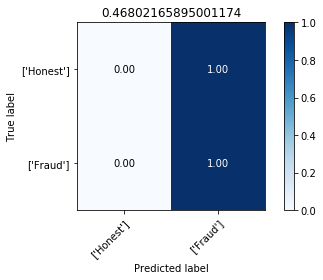

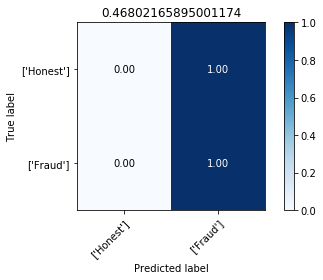

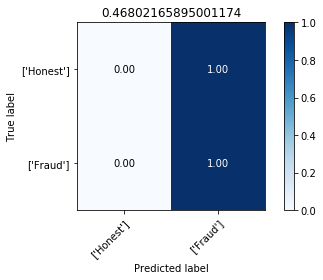

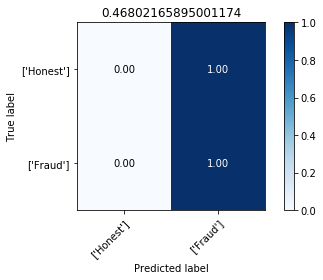

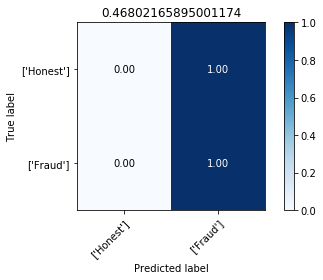

...

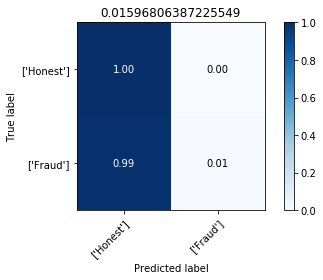

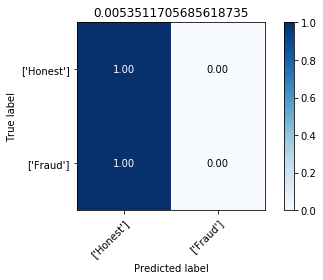

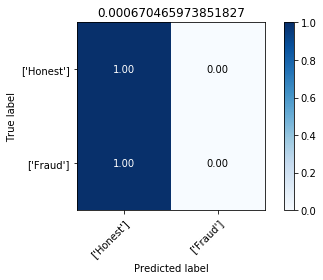

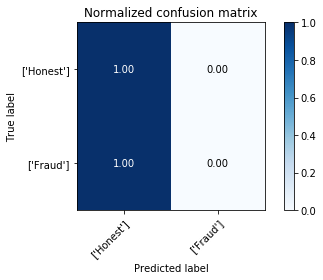

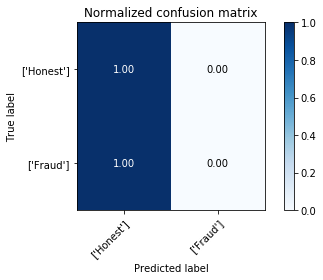

In [115]:
for i in range(len(yprob)):
    plot_confusion_matrix(y_data[1], yprob[i],
                          classes = np.array([['Honest'],['Fraud']]),
                          normalize=True,
                          title= f1[i],
                          cmap=plt.cm.Blues)

In [116]:
max(f1)

0.7171415079490006

- ## Geometric Mean of the probabilities 

In [117]:
precision,recall,f1,yprob = choosing_threshold(new_data[1]['target'],new_data[1]['geo_mean'],np.arange(0,1,0.01))

Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[8.85086296e-04 9.99114914e-01]
 [0.00000000e+00 1.00000000e+00]]
Normalized confusion matrix
[[2.37498156e-02 9.76250184e-01]
 [3.35345406e-04 9.99664655e-01]]
Normalized confusion matrix
[[0.07390471 0.92609529]
 [0.00167673 0.99832327]]
Normalized confusion matrix
[[0.13807346 0.86192654]
 [0.00335345 0.99664655]]
Normalized confusion matrix
[[0.20194719 0.79805281]
 [0.00838364 0.99161636]]
Normalized confusion matrix
[[0.2677386  0.7322614 ]
 [0.01374916 0.98625084]]
Normalized confusion matrix
[[0.32320401 0.67679599]
 [0.02079142 0.97920858]]
Normalized confusion matrix
[[0.37911196 0.62088804]
 [0.02783367 0.97216633]]
Normalized confusion matrix
[[0.4297094  0.5702906 ]
 [0.03688799 0.96311201]]
Normalized confusion matrix
[[0.47838914 0.52161086]
 [0.04661301 0.95338699]]
Normalized confusion matrix
[[0.52780646 0.47219354]
 [0.06069752 0.93930248]]
Normalized confusion matrix
[[0.57073315 0.42926685]

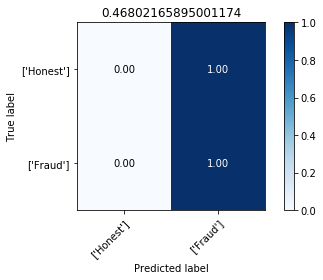

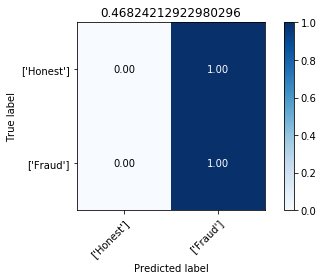

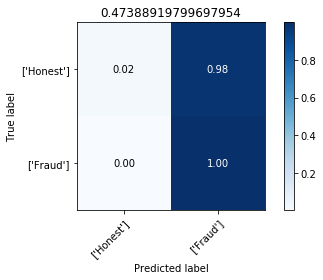

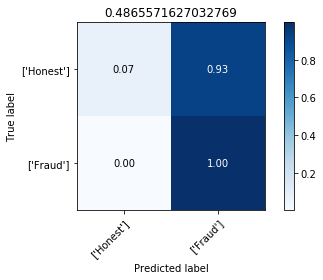

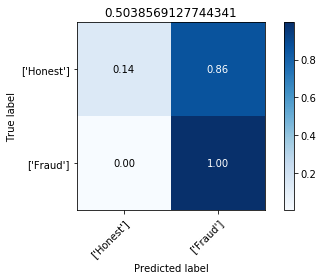

...

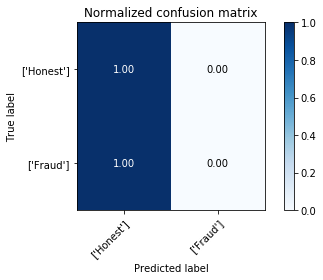

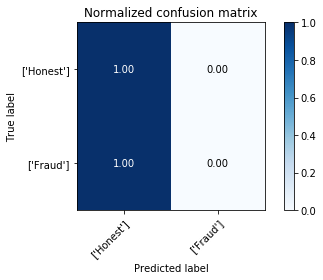

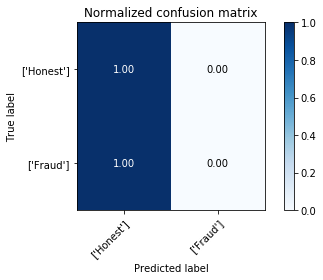

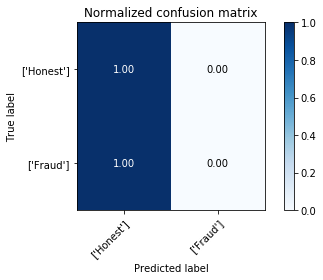

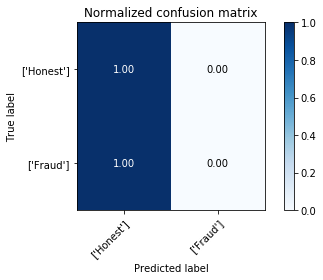

In [118]:
for i in range(len(yprob)):
    plot_confusion_matrix(y_data[1], yprob[i],
                          classes = np.array([['Honest'],['Fraud']]),
                          normalize=True,
                          title= f1[i],
                          cmap=plt.cm.Blues)

In [119]:
max(f1)

0.7172048042427078

## CatBoost has the best performance of the 3 algorithms, fot the validation data makes 71,249% at the F1 Score metric, so the mean and the geometric mean didn't has effect

# Creating a new Algorithm that will try to understand a behavior in the answer of the three others algorithm

- ## Traying a Neural Network

In [120]:
modelf = models.Sequential()
modelf.add(layers.Dense(units = 6, activation='tanh',input_shape = (11,)))
modelf.add(layers.Dense(units = 1,activation = 'sigmoid'))

modelf.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 6)                 72        
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 7         
Total params: 79
Trainable params: 79
Non-trainable params: 0
_________________________________________________________________


In [121]:
mom = optimizers.SGD(lr=0.0001, decay=0, momentum=0.9, nesterov=True)
modelf.compile(loss = 'binary_crossentropy',metrics=[f1Score],optimizer = mom)
history = modelf.fit(new_data[0].loc[:,'hat_xgb':'mean'],new_data[0]['target'],epochs = 50,batch_size=32, 
                     validation_data =(new_data[1].loc[:,'hat_xgb':'mean'],new_data[1]['target']))

Train on 45551 samples, validate on 9761 samples
Epoch 1/50
45551/45551 [==============================] - 2s 34us/step - loss: 0.7220 - f1Score: 0.0265 - val_loss: 0.6052 - val_f1Score: 0.0000e+00
Epoch 2/50
45551/45551 [==============================] - 1s 25us/step - loss: 0.5377 - f1Score: 0.2936 - val_loss: 0.5036 - val_f1Score: 0.5686
Epoch 3/50
45551/45551 [==============================] - 1s 24us/step - loss: 0.4440 - f1Score: 0.6515 - val_loss: 0.4495 - val_f1Score: 0.6186
Epoch 4/50
45551/45551 [==============================] - 1s 26us/step - loss: 0.3896 - f1Score: 0.7184 - val_loss: 0.4220 - val_f1Score: 0.6639
Epoch 5/50
45551/45551 [==============================] - 1s 31us/step - loss: 0.3578 - f1Score: 0.7643 - val_loss: 0.4085 - val_f1Score: 0.6937
Epoch 6/50
45551/45551 [==============================] - 1s 31us/step - loss: 0.3386 - f1Score: 0.7829 - val_loss: 0.4023 - val_f1Score: 0.7003
Epoch 7/50
45551/45551 [==============================] - 1s 33us/step - loss

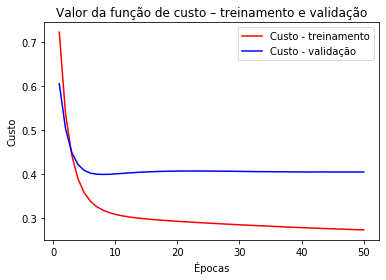

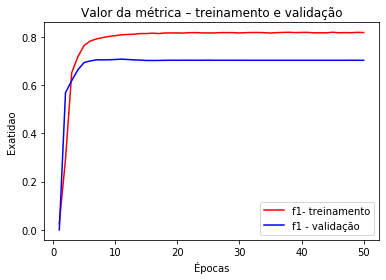

In [122]:
# Salva treinamento na variável history para visualização
history_dict = history.history
# Salva custos, métricas e epocas em vetores
custo = history_dict['loss']
metrica = history_dict['f1Score']
val_custo = history_dict['val_loss']
val_metrica = history_dict['val_f1Score']
# Cria vetor de épocas
epocas = range(1, len(custo) + 1)
# Gráfico dos valores de custo
plt.plot(epocas, custo, 'b', label='Custo - treinamento',color = 'red')
plt.plot(epocas, val_custo, 'b', label='Custo - validação')
plt.title('Valor da função de custo – treinamento e validação')
plt.xlabel('Épocas')
plt.ylabel('Custo')
plt.legend()
plt.show()
# Gráfico dos valores da métrica
plt.plot(epocas, metrica, 'b', label='f1- treinamento',color = 'red')
plt.plot(epocas, val_metrica, 'b', label='f1 - validação')
plt.title('Valor da métrica – treinamento e validação')
plt.xlabel('Épocas')
plt.ylabel('Exatidao')
plt.legend()
plt.show()

In [123]:
precision,recall,f1,yprob = choosing_threshold(new_data[1]['target'],
                                               modelf.predict(new_data[1].loc[:,'hat_xgb':'mean'])
                                                              ,np.arange(0,1,0.01))

Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0.16034813 0.83965187]
 [0.00435949 0.99564051]]
Normalized confusion matrix
[[0.31037026 0.68962974]
 [0.02045607 0.97954393]]
Normalized confusion matrix
[[0.41053253 0.58946747]
 [0.03353454 0.96646546]]
Normalized confusion matrix
[[0.49033781 0.50966219]
 [0.04996647 0.95003353]]
Normalized confusion matrix
[[0.55406402 0.44593598]
 [0.0620389  0.9379611 ]]
Normalized confusion matrix
[[0.59654816 0.40345184]
 [0.07276995 0.92723005]]
Normalized confusion matrix
[[0.63622953 0.36377047]
 [0.08685446 0.91314554]]
Normalized confusion matrix
[[0.66676501 0.33323499]
 [0.09758551 0.90241449]]
Normalized confusion matrix
[[0.69420268 0.30579732]
 [0.11334675 0.88665325]]
Normalized confusion matrix
[[0.71544476 0.28455524]
 [0.12575453 0.87424547]]
Normalized confusion matrix
[[0.73462163 0.26537837]
 [0.13916834 0.8

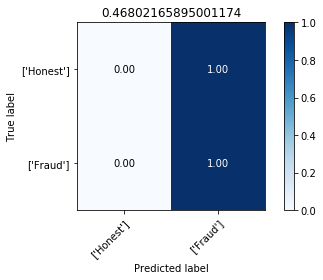

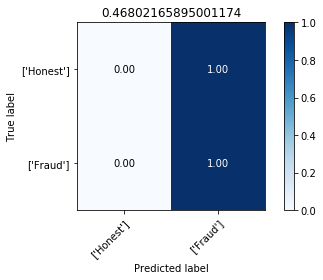

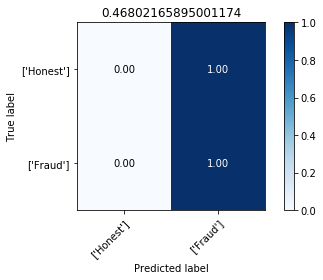

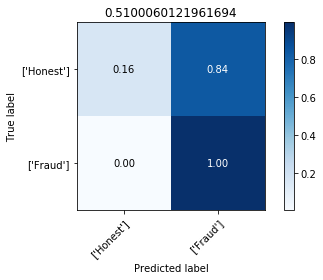

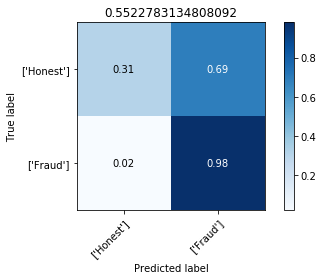

...

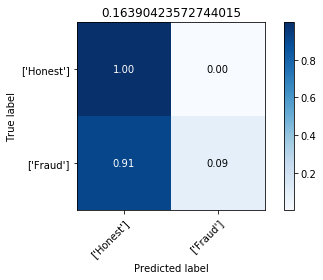

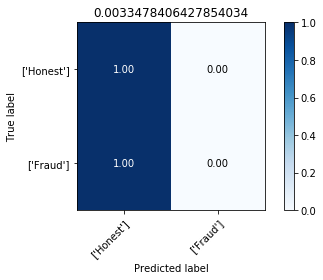

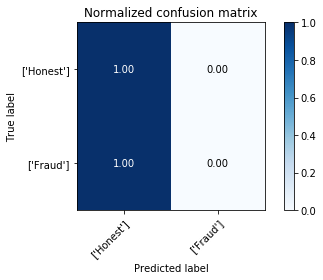

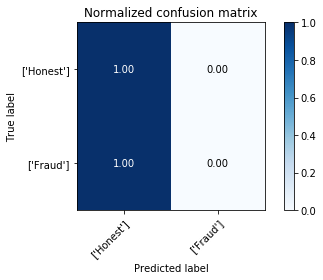

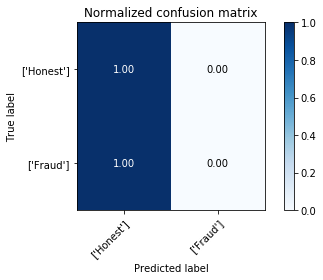

In [124]:
for i in range(len(yprob)):
    plot_confusion_matrix(y_data[1], yprob[i],
                          classes = np.array([['Honest'],['Fraud']]),
                          normalize=True,
                          title= f1[i],
                          cmap=plt.cm.Blues)

In [125]:
max(f1)

0.7259900593233927

- ## Traying a CatBoost

In [126]:
model = CatBoostClassifier(iterations=2000,eval_metric= 'F1',random_seed=42,verbose=False)
model.fit(new_data[0].loc[:,'hat_xgb':'mean'], new_data[0]['target'])

In [127]:
precision,recall,f1,yprob = choosing_threshold(new_data[1]['target'],
                                               model.predict_proba(new_data[1].loc[:,'hat_xgb':'mean'])[:,1]
                                               ,np.arange(0,1,0.01))

In [128]:
max(f1)

0.7177829099307159

# As we can see, just put the output of the threee algorithm like a input for the other one didn't have a much better result. 
# Now we will try to simply ther work for the Combiner, doing some analysis

- ## XGBoost and CatBoost predict anomaly

    - They are right in 2077 times and wrong in 801 times

In [129]:
new_data[1][(new_data[1].hat_cat == 1) & (new_data[1].hat_xgb == 1) 
            & (new_data[1].target == 1)].count()

hat_xgb      2077
prob1_xgb    2077
prob0_xgb    2077
hat_cat      2077
prob1_cat    2077
prob0_cat    2077
hat_rna      2077
prob1_rna    2077
prob0_rna    2077
geo_mean     2077
mean         2077
target       2077
dtype: int64

In [130]:
new_data[1][(new_data[1].hat_cat == 1) & (new_data[1].hat_xgb == 1) 
            & (new_data[1].target == 0)].count()

hat_xgb      801
prob1_xgb    801
prob0_xgb    801
hat_cat      801
prob1_cat    801
prob0_cat    801
hat_rna      801
prob1_rna    801
prob0_rna    801
geo_mean     801
mean         801
target       801
dtype: int64

- ## CatBoost and RNA predict non-anomaly

    - They are right in 5801 times and wrong in 755 times

In [131]:
new_data[1][(new_data[1].hat_cat == 0) & (new_data[1].hat_rna == 0) 
            & (new_data[1].target == 0)].count()

hat_xgb      5801
prob1_xgb    5801
prob0_xgb    5801
hat_cat      5801
prob1_cat    5801
prob0_cat    5801
hat_rna      5801
prob1_rna    5801
prob0_rna    5801
geo_mean     5801
mean         5801
target       5801
dtype: int64

In [132]:
new_data[1][(new_data[1].hat_cat == 0) & (new_data[1].hat_rna == 0) 
            & (new_data[1].target == 1)].count()

hat_xgb      755
prob1_xgb    755
prob0_xgb    755
hat_cat      755
prob1_cat    755
prob0_cat    755
hat_rna      755
prob1_rna    755
prob0_rna    755
geo_mean     755
mean         755
target       755
dtype: int64

# Now we will exclude this cases form the input of the Combiner

In [133]:
new_data[0].head()

,hat_xgb,prob1_xgb,prob0_xgb,hat_cat,prob1_cat,prob0_cat,hat_rna,prob1_rna,prob0_rna,geo_mean,mean,target
id,,,,,,,,,,,,
0,0.0,0.657060,0.657060,0.0,0.031772,0.968228,0.0,0.058842,0.941158,0.046877,0.249225,0.0
1,0.0,0.633083,0.633083,0.0,0.029919,0.970081,0.0,0.126966,0.873034,0.062078,0.263323,0.0
2,0.0,0.687710,0.687710,1.0,0.507097,0.492903,0.0,0.253116,0.746884,0.205193,0.482641,1.0
3,1.0,0.933945,0.933945,1.0,0.980173,0.019827,1.0,0.885128,0.114872,0.321569,0.933082,1.0
4,0.0,0.653517,0.653517,0.0,0.094978,0.905022,0.0,0.085252,0.914748,0.087249,0.277916,0.0


In [134]:
p0 = []
p1 = []
for i in range(len(new_data)):
    p0.append(new_data[i].loc[(new_data[i]['hat_cat']==0) & (new_data[i]['hat_rna']==0)])
    p1.append(new_data[i].loc[(new_data[i]['hat_cat']==1) & (new_data[i]['hat_xgb']==1)])
    new_data[i] =  new_data[i].drop(p0[i].index)
    new_data[i] =  new_data[i].drop(p1[i].index)
    p0[i]['ans'] = 0
    p1[i]['ans'] = 1

## Creating the Combiner again

In [60]:
K.clear_session()

modelf = models.Sequential()
modelf.add(layers.Dense(units = 6, activation='tanh',input_shape = (11,)))
modelf.add(layers.Dense(units = 1,activation = 'sigmoid'))

modelf.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 6)                 72        
_________________________________________________________________
dense_2 (Dense)              (None, 1)                 7         
Total params: 79
Trainable params: 79
Non-trainable params: 0
_________________________________________________________________


In [61]:
mom = optimizers.SGD(lr=0.0001, decay=0, momentum=0.9, nesterov=True)
modelf.compile(loss = 'binary_crossentropy',metrics=[f1Score],optimizer = mom)
history = modelf.fit(new_data[0].loc[:,'hat_xgb':'mean'],new_data[0]['target'],epochs = 500,batch_size=32, 
                     validation_data =(new_data[1].loc[:,'hat_xgb':'mean'],new_data[1]['target']))

Train on 1386 samples, validate on 327 samples
Epoch 1/500
1386/1386 [==============================] - 0s 346us/step - loss: 0.8585 - f1Score: 0.4045 - val_loss: 0.7444 - val_f1Score: 0.6220
Epoch 2/500
1386/1386 [==============================] - 0s 76us/step - loss: 0.8144 - f1Score: 0.3978 - val_loss: 0.7276 - val_f1Score: 0.6204
Epoch 3/500
1386/1386 [==============================] - 0s 75us/step - loss: 0.7759 - f1Score: 0.3904 - val_loss: 0.7155 - val_f1Score: 0.6158
Epoch 4/500
1386/1386 [==============================] - 0s 75us/step - loss: 0.7440 - f1Score: 0.3809 - val_loss: 0.7071 - val_f1Score: 0.5614
Epoch 5/500
1386/1386 [==============================] - 0s 73us/step - loss: 0.7177 - f1Score: 0.3079 - val_loss: 0.7014 - val_f1Score: 0.3122
Epoch 6/500
1386/1386 [==============================] - 0s 77us/step - loss: 0.6957 - f1Score: 0.2609 - val_loss: 0.6979 - val_f1Score: 0.2667
Epoch 7/500
1386/1386 [==============================] - 0s 77us/step - loss: 0.6771 - f

1386/1386 [==============================] - 0s 55us/step - loss: 0.5430 - f1Score: 0.0000e+00 - val_loss: 0.7851 - val_f1Score: 0.0000e+00
Epoch 109/500
1386/1386 [==============================] - 0s 55us/step - loss: 0.5428 - f1Score: 0.0000e+00 - val_loss: 0.7851 - val_f1Score: 0.0000e+00
Epoch 110/500
1386/1386 [==============================] - 0s 55us/step - loss: 0.5426 - f1Score: 0.0000e+00 - val_loss: 0.7851 - val_f1Score: 0.0000e+00
Epoch 111/500
1386/1386 [==============================] - 0s 54us/step - loss: 0.5424 - f1Score: 0.0000e+00 - val_loss: 0.7849 - val_f1Score: 0.0000e+00
Epoch 112/500
1386/1386 [==============================] - 0s 50us/step - loss: 0.5423 - f1Score: 0.0000e+00 - val_loss: 0.7848 - val_f1Score: 0.0000e+00
Epoch 113/500
1386/1386 [==============================] - 0s 50us/step - loss: 0.5421 - f1Score: 0.0000e+00 - val_loss: 0.7848 - val_f1Score: 0.0000e+00
Epoch 114/500
1386/1386 [==============================] - 0s 47us/step - loss: 0.5419 - f

Epoch 163/500
1386/1386 [==============================] - 0s 52us/step - loss: 0.5337 - f1Score: 0.1117 - val_loss: 0.7852 - val_f1Score: 0.0974
Epoch 164/500
1386/1386 [==============================] - 0s 52us/step - loss: 0.5336 - f1Score: 0.1119 - val_loss: 0.7849 - val_f1Score: 0.0974
Epoch 165/500
1386/1386 [==============================] - 0s 54us/step - loss: 0.5334 - f1Score: 0.1183 - val_loss: 0.7852 - val_f1Score: 0.0974
Epoch 166/500
1386/1386 [==============================] - 0s 60us/step - loss: 0.5333 - f1Score: 0.1187 - val_loss: 0.7852 - val_f1Score: 0.0974
Epoch 167/500
1386/1386 [==============================] - 0s 57us/step - loss: 0.5331 - f1Score: 0.1266 - val_loss: 0.7851 - val_f1Score: 0.0974
Epoch 168/500
1386/1386 [==============================] - 0s 59us/step - loss: 0.5330 - f1Score: 0.1141 - val_loss: 0.7850 - val_f1Score: 0.0965
Epoch 169/500
1386/1386 [==============================] - 0s 56us/step - loss: 0.5328 - f1Score: 0.1224 - val_loss: 0.7849 

1386/1386 [==============================] - 0s 60us/step - loss: 0.5207 - f1Score: 0.3988 - val_loss: 0.7881 - val_f1Score: 0.2401
Epoch 276/500
1386/1386 [==============================] - 0s 55us/step - loss: 0.5207 - f1Score: 0.3836 - val_loss: 0.7882 - val_f1Score: 0.2401
Epoch 277/500
1386/1386 [==============================] - 0s 57us/step - loss: 0.5206 - f1Score: 0.3749 - val_loss: 0.7878 - val_f1Score: 0.2401
Epoch 278/500
1386/1386 [==============================] - 0s 54us/step - loss: 0.5205 - f1Score: 0.3927 - val_loss: 0.7880 - val_f1Score: 0.2401
Epoch 279/500
1386/1386 [==============================] - 0s 54us/step - loss: 0.5204 - f1Score: 0.3723 - val_loss: 0.7878 - val_f1Score: 0.2401
Epoch 280/500
1386/1386 [==============================] - 0s 54us/step - loss: 0.5203 - f1Score: 0.3817 - val_loss: 0.7877 - val_f1Score: 0.2401
Epoch 281/500
1386/1386 [==============================] - 0s 56us/step - loss: 0.5202 - f1Score: 0.3751 - val_loss: 0.7877 - val_f1Score:

1386/1386 [==============================] - 0s 55us/step - loss: 0.5129 - f1Score: 0.3764 - val_loss: 0.7897 - val_f1Score: 0.2401
Epoch 388/500
1386/1386 [==============================] - 0s 54us/step - loss: 0.5128 - f1Score: 0.3994 - val_loss: 0.7898 - val_f1Score: 0.2401
Epoch 389/500
1386/1386 [==============================] - 0s 60us/step - loss: 0.5128 - f1Score: 0.3744 - val_loss: 0.7895 - val_f1Score: 0.2401
Epoch 390/500
1386/1386 [==============================] - 0s 57us/step - loss: 0.5127 - f1Score: 0.3809 - val_loss: 0.7898 - val_f1Score: 0.2401
Epoch 391/500
1386/1386 [==============================] - 0s 54us/step - loss: 0.5126 - f1Score: 0.4005 - val_loss: 0.7896 - val_f1Score: 0.2401
Epoch 392/500
1386/1386 [==============================] - 0s 54us/step - loss: 0.5126 - f1Score: 0.4040 - val_loss: 0.7895 - val_f1Score: 0.2401
Epoch 393/500
1386/1386 [==============================] - 0s 53us/step - loss: 0.5125 - f1Score: 0.3791 - val_loss: 0.7897 - val_f1Score:

1386/1386 [==============================] - 0s 55us/step - loss: 0.5076 - f1Score: 0.3644 - val_loss: 0.7896 - val_f1Score: 0.2401
Epoch 500/500
1386/1386 [==============================] - 0s 55us/step - loss: 0.5076 - f1Score: 0.3762 - val_loss: 0.7900 - val_f1Score: 0.2401


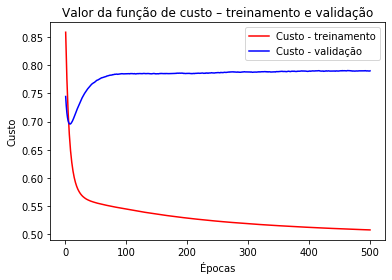

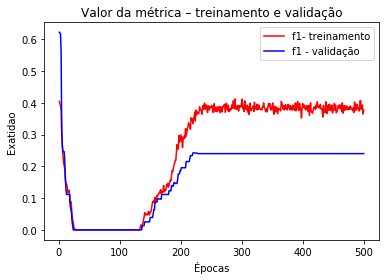

In [62]:
# Salva treinamento na variável history para visualização
history_dict = history.history
# Salva custos, métricas e epocas em vetores
custo = history_dict['loss']
metrica = history_dict['f1Score']
val_custo = history_dict['val_loss']
val_metrica = history_dict['val_f1Score']
# Cria vetor de épocas
epocas = range(1, len(custo) + 1)
# Gráfico dos valores de custo
plt.plot(epocas, custo, 'b', label='Custo - treinamento',color = 'red')
plt.plot(epocas, val_custo, 'b', label='Custo - validação')
plt.title('Valor da função de custo – treinamento e validação')
plt.xlabel('Épocas')
plt.ylabel('Custo')
plt.legend()
plt.show()
# Gráfico dos valores da métrica
plt.plot(epocas, metrica, 'b', label='f1- treinamento',color = 'red')
plt.plot(epocas, val_metrica, 'b', label='f1 - validação')
plt.title('Valor da métrica – treinamento e validação')
plt.xlabel('Épocas')
plt.ylabel('Exatidao')
plt.legend()
plt.show()

In [63]:
precision,recall,f1,yprob = choosing_threshold(new_data[1]['target'],
                                               modelf.predict(new_data[1].loc[:,'hat_xgb':'mean'])
                                                              ,np.arange(0,1,0.01))

In [64]:
max(f1)

0.6530612244897959

Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0.16949153 0.83050847]
 [0.04 

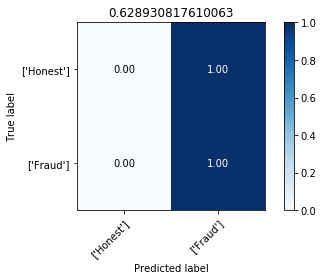

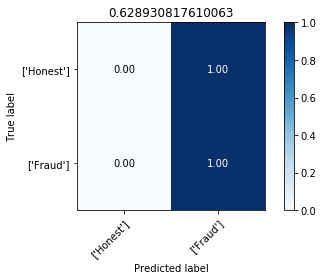

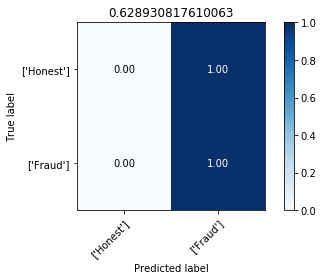

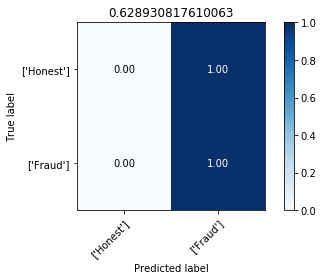

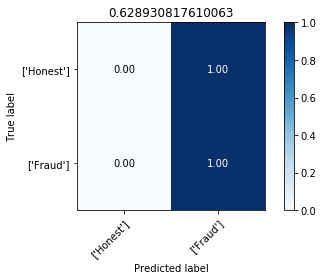

...

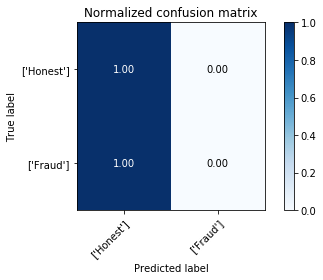

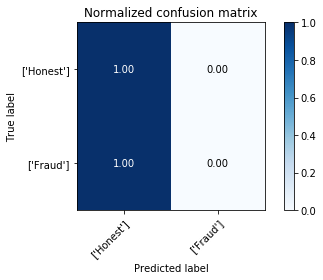

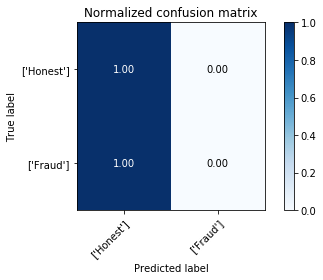

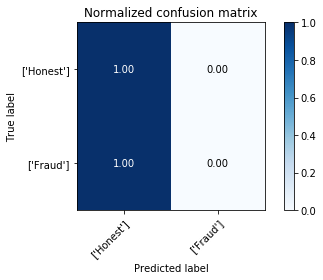

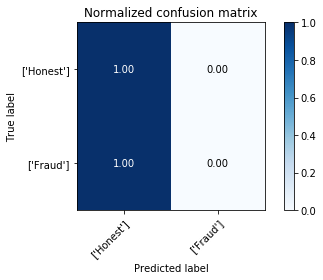

In [65]:
for i in range(len(yprob)):
    plot_confusion_matrix(new_data[1]['target'].astype(int), yprob[i],
                          classes = np.array([['Honest'],['Fraud']]),
                          normalize=True,
                          title= f1[i],
                          cmap=plt.cm.Blues)

- ## Traying a CatBoost

In [66]:
model = CatBoostClassifier(iterations=2000,eval_metric= 'F1',random_seed=42,verbose=False)
model.fit(new_data[0].loc[:,'hat_xgb':'mean'], new_data[0]['target'])

In [67]:
precision,recall,f1,yprob = choosing_threshold(new_data[1]['target'],
                                               model.predict_proba(new_data[1].loc[:,'hat_xgb':'mean'])[:,1]
                                               ,np.arange(0,1,0.01))

Normalized confusion matrix
[[0. 1.]
 [0. 1.]]
Normalized confusion matrix
[[0.01694915 0.98305085]
 [0.         1.        ]]
Normalized confusion matrix
[[0.03389831 0.96610169]
 [0.         1.        ]]
Normalized confusion matrix
[[0.03954802 0.96045198]
 [0.00666667 0.99333333]]
Normalized confusion matrix
[[0.05084746 0.94915254]
 [0.00666667 0.99333333]]
Normalized confusion matrix
[[0.08474576 0.91525424]
 [0.00666667 0.99333333]]
Normalized confusion matrix
[[0.10734463 0.89265537]
 [0.02666667 0.97333333]]
Normalized confusion matrix
[[0.1299435  0.8700565 ]
 [0.02666667 0.97333333]]
Normalized confusion matrix
[[0.16384181 0.83615819]
 [0.03333333 0.96666667]]
Normalized confusion matrix
[[0.18079096 0.81920904]
 [0.06       0.94      ]]
Normalized confusion matrix
[[0.1920904  0.8079096 ]
 [0.08666667 0.91333333]]
Normalized confusion matrix
[[0.24858757 0.75141243]
 [0.09333333 0.90666667]]
Normalized confusion matrix
[[0.28248588 0.71751412]
 [0.10666667 0.89333333]]
Norma

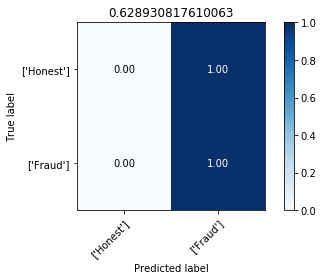

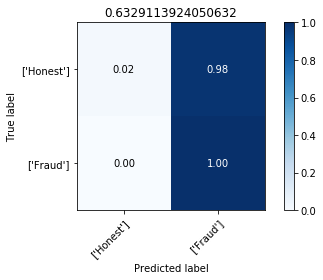

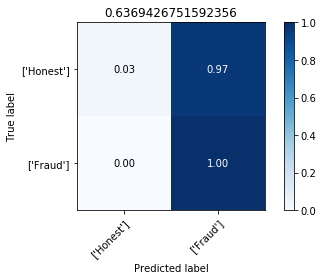

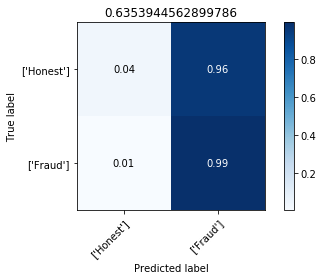

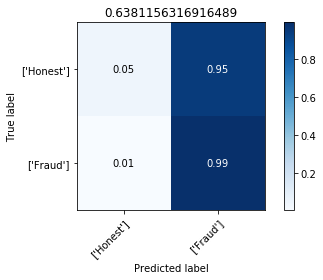

...

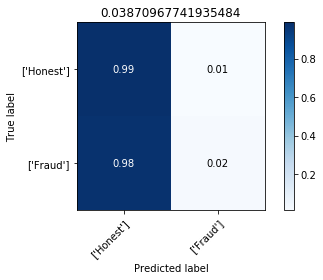

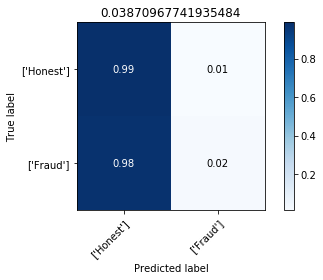

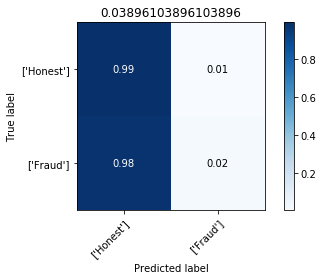

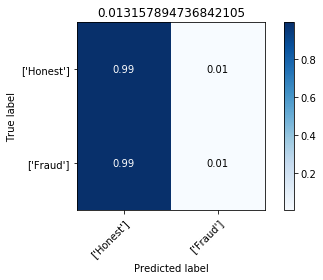

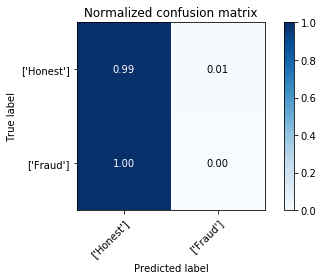

In [68]:
for i in range(len(yprob)):
    plot_confusion_matrix(new_data[1]['target'].astype(int), yprob[i],
                          classes = np.array([['Honest'],['Fraud']]),
                          normalize=True,
                          title= f1[i],
                          cmap=plt.cm.Blues)

In [69]:
max(f1)

0.654627539503386

# Putting the answer of the combiner in the dataFrame

In [70]:
for i in range(len(new_data)):
    new_data[i]['ans'] = predict_threshold(model.predict_proba(new_data[i].loc[:,'hat_xgb':'mean'])[:,1],
                                           threshold_list[f1.index(max(f1))])

# Putting the P0 and P1 together

In [71]:
p = []
for i in range(len(p0)):
    aux = pd.concat([p0[i],p1[i]])
    aux = aux.sort_index()
    p.append(aux)

# Putting all the answers together


In [72]:
for i in range(len(p)):
    new_data[i] = (pd.concat([new_data[i],p[i]])).sort_index()

In [75]:
new_data[0].head()

,hat_xgb,prob1_xgb,prob0_xgb,hat_cat,prob1_cat,prob0_cat,hat_rna,prob1_rna,prob0_rna,geo_mean,mean,target,ans
id,,,,,,,,,,,,,
0,0.0,0.657060,0.657060,0.0,0.031772,0.968228,0.0,0.058842,0.941158,0.046877,0.249225,0.0,0
1,0.0,0.633083,0.633083,0.0,0.029919,0.970081,0.0,0.126966,0.873034,0.062078,0.263323,0.0,0
2,0.0,0.687710,0.687710,1.0,0.507097,0.492903,0.0,0.253116,0.746884,0.205193,0.482641,1.0,1
3,1.0,0.933945,0.933945,1.0,0.980173,0.019827,1.0,0.885128,0.114872,0.321569,0.933082,1.0,1
4,0.0,0.653517,0.653517,0.0,0.094978,0.905022,0.0,0.085252,0.914748,0.087249,0.277916,0.0,0


# Evaluating the combiner

Normalized confusion matrix
[[0.90856997 0.09143003]
 [0.1744112  0.8255888 ]]
Normalized confusion matrix
[[0.86000885 0.13999115]
 [0.25486251 0.74513749]]
Normalized confusion matrix
[[0.86350236 0.13649764]
 [0.25764192 0.74235808]]


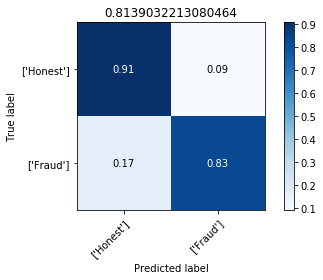

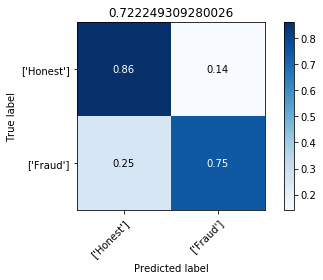

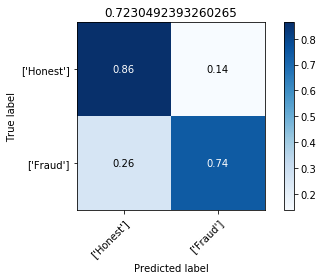

In [74]:
for i in range(len(new_data)):
    plot_confusion_matrix(new_data[i]['target'].astype(int), new_data[i]['ans'].astype(int),
                          classes = np.array([['Honest'],['Fraud']]),
                          normalize=True,
                          title= f1_score(new_data[i]['target'].astype(int), new_data[i]['ans'].astype(int)),
                          cmap=plt.cm.Blues)